# Updating and Expanding on Group Assignment #1 

##### Contributor: Emily Cadena

## Who’s Most at Risk? Social Demographics and Traffic Collisions in the City of Los Angeles

### Our research will evaluate different socio-demographic characteristics, such as median household income, race and ethnicity, and age to explore which communities are most susceptible to traffic collisions in the City of Los Angeles. This notebook will explore race and ethnicity in the City of LA. Unlike the previous assignment, I focused on LA County. 

## Data Sources & Geographic Information

American Community Survey (ACS) 2015-2019 (5-Year Estimates) - Hispanic or Latino by Race  
2019 Census Tracts from IPUMS NHGIS

### Importing libraries

In [1]:
# importing pandas for data exploration 
import pandas as pd
import geopandas as gpd

# importing for plots and tables 
import matplotlib.pyplot as plt
import contextily as ctx

#importing for interactive plots 
import plotly.express as px

In [2]:
# upload acs 2015-2019
race = pd.read_csv('data4/race15_19.csv')

In [3]:
# rows and columns 
race.shape

(2346, 39)

In [4]:
# too many columns to populate, so we need more info
race.info(verbose=True, show_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2346 entries, 0 to 2345
Data columns (total 39 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Geo_FIPS           2346 non-null   int64  
 1   Geo_GEOID          2346 non-null   object 
 2   Geo_NAME           2346 non-null   object 
 3   Geo_QName          2346 non-null   object 
 4   Geo_STUSAB         2346 non-null   object 
 5   Geo_SUMLEV         2346 non-null   int64  
 6   Geo_GEOCOMP        2346 non-null   int64  
 7   Geo_FILEID         2346 non-null   object 
 8   Geo_LOGRECNO       2346 non-null   int64  
 9   Geo_US             0 non-null      float64
 10  Geo_REGION         0 non-null      float64
 11  Geo_DIVISION       0 non-null      float64
 12  Geo_STATECE        0 non-null      float64
 13  Geo_STATE          2346 non-null   int64  
 14  Geo_COUNTY         2346 non-null   int64  
 15  Geo_COUSUB         0 non-null      float64
 16  Geo_PLACE          0 non

In [5]:
race.head(5)

,Geo_FIPS,Geo_GEOID,Geo_NAME,Geo_QName,Geo_STUSAB,Geo_SUMLEV,Geo_GEOCOMP,Geo_FILEID,Geo_LOGRECNO,Geo_US,...,SE_B04001_010,PCT_SE_B04001_002,PCT_SE_B04001_003,PCT_SE_B04001_004,PCT_SE_B04001_005,PCT_SE_B04001_006,PCT_SE_B04001_007,PCT_SE_B04001_008,PCT_SE_B04001_009,PCT_SE_B04001_010
0,6037101110,14000US06037101110,Census Tract 1011.10,"Census Tract 1011.10, Los Angeles County, Cali...",ca,140,0,ACSSF,3871,NaN,...,1188,72.26,61.08,0.44,0.07,7.73,0.07,0.19,2.69,27.74
1,6037101122,14000US06037101122,Census Tract 1011.22,"Census Tract 1011.22, Los Angeles County, Cali...",ca,140,0,ACSSF,3872,NaN,...,147,95.68,84.64,2.17,0.44,6.46,0.00,0.00,1.97,4.32
2,6037101210,14000US06037101210,Census Tract 1012.10,"Census Tract 1012.10, Los Angeles County, Cali...",ca,140,0,ACSSF,3873,NaN,...,2616,58.78,47.05,3.12,0.00,7.66,0.00,0.74,0.22,41.22
3,6037101220,14000US06037101220,Census Tract 1012.20,"Census Tract 1012.20, Los Angeles County, Cali...",ca,140,0,ACSSF,3874,NaN,...,1364,63.16,48.95,2.35,0.00,9.21,0.00,0.00,2.65,36.84
4,6037101300,14000US06037101300,Census Tract 1013,"Census Tract 1013, Los Angeles County, California",ca,140,0,ACSSF,3875,NaN,...,297,92.35,80.48,5.28,0.00,4.99,0.00,0.00,1.60,7.65


### Converting Data Types

In [6]:
# going into the Geo_FIPS column
# leading zero is missing 
race.Geo_FIPS.head()

0    6037101110
1    6037101122
2    6037101210
3    6037101220
4    6037101300
Name: Geo_FIPS, dtype: int64

In [7]:
# converting FIPS, state, and county data type from integer to string to include leading zero 
race = pd.read_csv('data4/race15_19.csv',
     dtype=
                 {'Geo_FIPS': str, 
                  'Geo_STATE': str, 
                  'Geo_COUNTY': str })

In [8]:
race.head(5)

,Geo_FIPS,Geo_GEOID,Geo_NAME,Geo_QName,Geo_STUSAB,Geo_SUMLEV,Geo_GEOCOMP,Geo_FILEID,Geo_LOGRECNO,Geo_US,...,SE_B04001_010,PCT_SE_B04001_002,PCT_SE_B04001_003,PCT_SE_B04001_004,PCT_SE_B04001_005,PCT_SE_B04001_006,PCT_SE_B04001_007,PCT_SE_B04001_008,PCT_SE_B04001_009,PCT_SE_B04001_010
0,06037101110,14000US06037101110,Census Tract 1011.10,"Census Tract 1011.10, Los Angeles County, Cali...",ca,140,0,ACSSF,3871,NaN,...,1188,72.26,61.08,0.44,0.07,7.73,0.07,0.19,2.69,27.74
1,06037101122,14000US06037101122,Census Tract 1011.22,"Census Tract 1011.22, Los Angeles County, Cali...",ca,140,0,ACSSF,3872,NaN,...,147,95.68,84.64,2.17,0.44,6.46,0.00,0.00,1.97,4.32
2,06037101210,14000US06037101210,Census Tract 1012.10,"Census Tract 1012.10, Los Angeles County, Cali...",ca,140,0,ACSSF,3873,NaN,...,2616,58.78,47.05,3.12,0.00,7.66,0.00,0.74,0.22,41.22
3,06037101220,14000US06037101220,Census Tract 1012.20,"Census Tract 1012.20, Los Angeles County, Cali...",ca,140,0,ACSSF,3874,NaN,...,1364,63.16,48.95,2.35,0.00,9.21,0.00,0.00,2.65,36.84
4,06037101300,14000US06037101300,Census Tract 1013,"Census Tract 1013, Los Angeles County, California",ca,140,0,ACSSF,3875,NaN,...,297,92.35,80.48,5.28,0.00,4.99,0.00,0.00,1.60,7.65


In [9]:
# checking state and county
print(race.Geo_STATE.head(2))     
print(race.Geo_COUNTY.head(2))

0    06
1    06
Name: Geo_STATE, dtype: object
0    037
1    037
Name: Geo_COUNTY, dtype: object


In [10]:
# updated data type for state, county, and census tract 
race.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2346 entries, 0 to 2345
Data columns (total 39 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Geo_FIPS           2346 non-null   object 
 1   Geo_GEOID          2346 non-null   object 
 2   Geo_NAME           2346 non-null   object 
 3   Geo_QName          2346 non-null   object 
 4   Geo_STUSAB         2346 non-null   object 
 5   Geo_SUMLEV         2346 non-null   int64  
 6   Geo_GEOCOMP        2346 non-null   int64  
 7   Geo_FILEID         2346 non-null   object 
 8   Geo_LOGRECNO       2346 non-null   int64  
 9   Geo_US             0 non-null      float64
 10  Geo_REGION         0 non-null      float64
 11  Geo_DIVISION       0 non-null      float64
 12  Geo_STATECE        0 non-null      float64
 13  Geo_STATE          2346 non-null   object 
 14  Geo_COUNTY         2346 non-null   object 
 15  Geo_COUSUB         0 non-null      float64
 16  Geo_PLACE          0 non

### Cleaning and Reorganizing the data 

In [11]:
# find unnecessary columns with zero values 
race.columns[race.isna().all()].tolist()

['Geo_US',
 'Geo_REGION',
 'Geo_DIVISION',
 'Geo_STATECE',
 'Geo_COUSUB',
 'Geo_PLACE',
 'Geo_PLACESE',
 'Geo_PUMA1']

In [12]:
# deleting uncessary columns 
race = race.dropna(axis=1,how="all")

In [13]:
race.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2346 entries, 0 to 2345
Data columns (total 31 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Geo_FIPS           2346 non-null   object 
 1   Geo_GEOID          2346 non-null   object 
 2   Geo_NAME           2346 non-null   object 
 3   Geo_QName          2346 non-null   object 
 4   Geo_STUSAB         2346 non-null   object 
 5   Geo_SUMLEV         2346 non-null   int64  
 6   Geo_GEOCOMP        2346 non-null   int64  
 7   Geo_FILEID         2346 non-null   object 
 8   Geo_LOGRECNO       2346 non-null   int64  
 9   Geo_STATE          2346 non-null   object 
 10  Geo_COUNTY         2346 non-null   object 
 11  Geo_TRACT          2346 non-null   int64  
 12  SE_B04001_001      2346 non-null   int64  
 13  SE_B04001_002      2346 non-null   int64  
 14  SE_B04001_003      2346 non-null   int64  
 15  SE_B04001_004      2346 non-null   int64  
 16  SE_B04001_005      2346 

In [14]:
# keep columns
columns_to_keep = ['Geo_FIPS', 
                   'Geo_STATE', 
                   'Geo_COUNTY',
                   'Geo_TRACT',
                   'SE_B04001_001', 
                   'SE_B04001_002', 
                   'SE_B04001_003',      
                   'SE_B04001_004',       
                   'SE_B04001_005',        
                   'SE_B04001_006',       
                   'SE_B04001_007',        
                   'SE_B04001_008',       
                   'SE_B04001_009',      
                   'SE_B04001_010',      
                   'PCT_SE_B04001_002',  
                   'PCT_SE_B04001_003',
                   'PCT_SE_B04001_004',  
                   'PCT_SE_B04001_005',  
                   'PCT_SE_B04001_006',  
                   'PCT_SE_B04001_007',  
                   'PCT_SE_B04001_008',  
                   'PCT_SE_B04001_009',  
                   'PCT_SE_B04001_010']

race=race[columns_to_keep]
                   

In [15]:
# check updated columns 
race.head(2)

,Geo_FIPS,Geo_STATE,Geo_COUNTY,Geo_TRACT,SE_B04001_001,SE_B04001_002,SE_B04001_003,SE_B04001_004,SE_B04001_005,SE_B04001_006,...,SE_B04001_010,PCT_SE_B04001_002,PCT_SE_B04001_003,PCT_SE_B04001_004,PCT_SE_B04001_005,PCT_SE_B04001_006,PCT_SE_B04001_007,PCT_SE_B04001_008,PCT_SE_B04001_009,PCT_SE_B04001_010
0,06037101110,06,037,101110,4283,3095,2616,19,3,331,...,1188,72.26,61.08,0.44,0.07,7.73,0.07,0.19,2.69,27.74
1,06037101122,06,037,101122,3405,3258,2882,74,15,220,...,147,95.68,84.64,2.17,0.44,6.46,0.00,0.00,1.97,4.32


In [16]:
race.columns.to_list()

['Geo_FIPS',
 'Geo_STATE',
 'Geo_COUNTY',
 'Geo_TRACT',
 'SE_B04001_001',
 'SE_B04001_002',
 'SE_B04001_003',
 'SE_B04001_004',
 'SE_B04001_005',
 'SE_B04001_006',
 'SE_B04001_007',
 'SE_B04001_008',
 'SE_B04001_009',
 'SE_B04001_010',
 'PCT_SE_B04001_002',
 'PCT_SE_B04001_003',
 'PCT_SE_B04001_004',
 'PCT_SE_B04001_005',
 'PCT_SE_B04001_006',
 'PCT_SE_B04001_007',
 'PCT_SE_B04001_008',
 'PCT_SE_B04001_009',
 'PCT_SE_B04001_010']

In [17]:
# rename columns
# % is total population XXX (ex. % Total Population: Hispanic or Latino)
race.columns = ['FIPS',
                'State',
                'County',
                'Census Tract',
                'Total Population',
                'Total Population: Not Hispanic or Latino',
                'White',
                'Black',
                'American Indian and Alaska Native Alone',
                'Asian',
                'Native Hawaiian and Other Pacific Islander Alone',
                'Some Other Race Alone',
                'Two or More Races',
                'Hispanic or Latino',
                '% Not Hispanic or Latino',
                '% White Alone',
                '% Black or African American Alone',
                '% American Indian and Alaska Native Alone',
                '% Asian Alone',
                '% Native Hawaiian and Other Pacific Islander Alone',
                '% Some Other Race Alone',
                '% Two or More Races',
                '% Hispanic or Latino']
                    

In [18]:
race.head(2)

,FIPS,State,County,Census Tract,Total Population,Total Population: Not Hispanic or Latino,White,Black,American Indian and Alaska Native Alone,Asian,...,Hispanic or Latino,% Not Hispanic or Latino,% White Alone,% Black or African American Alone,% American Indian and Alaska Native Alone,% Asian Alone,% Native Hawaiian and Other Pacific Islander Alone,% Some Other Race Alone,% Two or More Races,% Hispanic or Latino
0,06037101110,06,037,101110,4283,3095,2616,19,3,331,...,1188,72.26,61.08,0.44,0.07,7.73,0.07,0.19,2.69,27.74
1,06037101122,06,037,101122,3405,3258,2882,74,15,220,...,147,95.68,84.64,2.17,0.44,6.46,0.00,0.00,1.97,4.32


In [19]:
race.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2346 entries, 0 to 2345
Data columns (total 23 columns):
 #   Column                                              Non-Null Count  Dtype  
---  ------                                              --------------  -----  
 0   FIPS                                                2346 non-null   object 
 1   State                                               2346 non-null   object 
 2   County                                              2346 non-null   object 
 3   Census Tract                                        2346 non-null   int64  
 4   Total Population                                    2346 non-null   int64  
 5   Total Population: Not Hispanic or Latino            2346 non-null   int64  
 6   White                                               2346 non-null   int64  
 7   Black                                               2346 non-null   int64  
 8   American Indian and Alaska Native Alone             2346 non-null   int64  
 9

# Important! 

### I want data specifically for the City of LA. At the moment, I have data for the entire County of LA. Next step is to merge the City of LA census tracts with LA County census data. Merging allows me to create maps and charts with data ONLY in the City of LA.   


# Merge 

In [20]:
# add city of LA census tract 
cityofla=gpd.read_file('data4/cityLA.zip')

In [21]:
cityofla.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 1168 entries, 0 to 1167
Data columns (total 17 columns):
 #   Column      Non-Null Count  Dtype   
---  ------      --------------  -----   
 0   GISJOIN     1168 non-null   object  
 1   STATEFP     1168 non-null   object  
 2   COUNTYFP    1168 non-null   object  
 3   TRACTCE     1168 non-null   object  
 4   GEOID       1168 non-null   object  
 5   NAME        1168 non-null   object  
 6   NAMELSAD    1168 non-null   object  
 7   MTFCC       1168 non-null   object  
 8   FUNCSTAT    1168 non-null   object  
 9   ALAND       1168 non-null   float64 
 10  AWATER      1168 non-null   float64 
 11  INTPTLAT    1168 non-null   object  
 12  INTPTLON    1168 non-null   object  
 13  Shape_Leng  1168 non-null   float64 
 14  Shape_Le_1  1168 non-null   float64 
 15  Shape_Area  1168 non-null   float64 
 16  geometry    1168 non-null   geometry
dtypes: float64(5), geometry(1), object(11)
memory usage: 155.3+ KB


In [22]:
cityofla.head(2)

,GISJOIN,STATEFP,COUNTYFP,TRACTCE,GEOID,NAME,NAMELSAD,MTFCC,FUNCSTAT,ALAND,AWATER,INTPTLAT,INTPTLON,Shape_Leng,Shape_Le_1,Shape_Area,geometry
0,G0600370101110,06,037,101110,06037101110,1011.10,Census Tract 1011.10,G5020,S,1142401.0,0.0,+34.2594737,-118.2929869,4585.520052,4585.520052,1.142400e+06,"POLYGON ((-2019033.589 -124429.155, -2018948.5..."
1,G0600370101122,06,037,101122,06037101122,1011.22,Census Tract 1011.22,G5020,S,2644045.0,0.0,+34.2677213,-118.2901465,9652.233049,9652.233049,2.644046e+06,"POLYGON ((-2017297.948 -125225.326, -2017305.0..."


<Axes: >

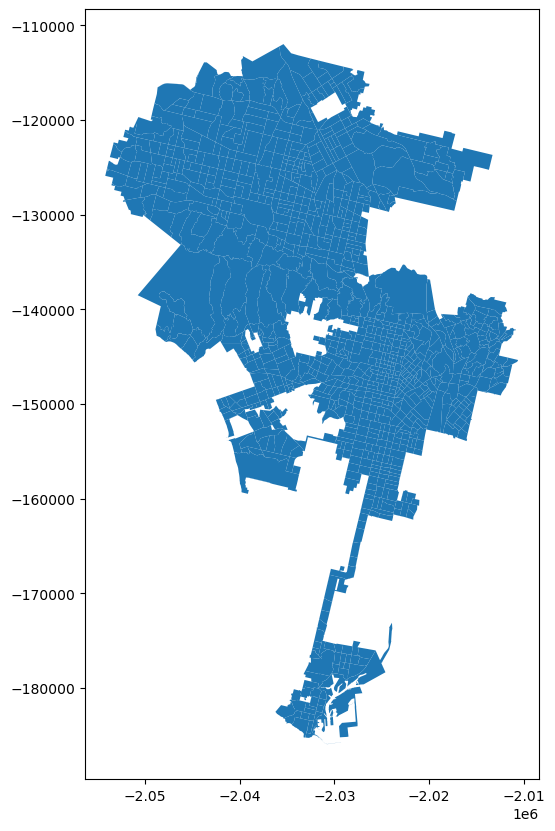

In [23]:
# plot census tracts 
cityofla.plot(figsize=(12,10))

In [24]:
# add a FIPS column
# creating a new column so that I can merge the shapefile and census tracts 
# mistake is probably here (hopefully not) 

cityofla['FIPS'] = '06' + '037' + cityofla['TRACTCE']

In [25]:
# checking new column was made 
cityofla.head(2)

,GISJOIN,STATEFP,COUNTYFP,TRACTCE,GEOID,NAME,NAMELSAD,MTFCC,FUNCSTAT,ALAND,AWATER,INTPTLAT,INTPTLON,Shape_Leng,Shape_Le_1,Shape_Area,geometry,FIPS
0,G0600370101110,06,037,101110,06037101110,1011.10,Census Tract 1011.10,G5020,S,1142401.0,0.0,+34.2594737,-118.2929869,4585.520052,4585.520052,1.142400e+06,"POLYGON ((-2019033.589 -124429.155, -2018948.5...",06037101110
1,G0600370101122,06,037,101122,06037101122,1011.22,Census Tract 1011.22,G5020,S,2644045.0,0.0,+34.2677213,-118.2901465,9652.233049,9652.233049,2.644046e+06,"POLYGON ((-2017297.948 -125225.326, -2017305.0...",06037101122


In [26]:
# need to merge by creating a new dataframe
la_race =cityofla.merge(race,on="FIPS")

In [27]:
# appears that everything merged 
la_race.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 1168 entries, 0 to 1167
Data columns (total 40 columns):
 #   Column                                              Non-Null Count  Dtype   
---  ------                                              --------------  -----   
 0   GISJOIN                                             1168 non-null   object  
 1   STATEFP                                             1168 non-null   object  
 2   COUNTYFP                                            1168 non-null   object  
 3   TRACTCE                                             1168 non-null   object  
 4   GEOID                                               1168 non-null   object  
 5   NAME                                                1168 non-null   object  
 6   NAMELSAD                                            1168 non-null   object  
 7   MTFCC                                               1168 non-null   object  
 8   FUNCSTAT                                            1168 non

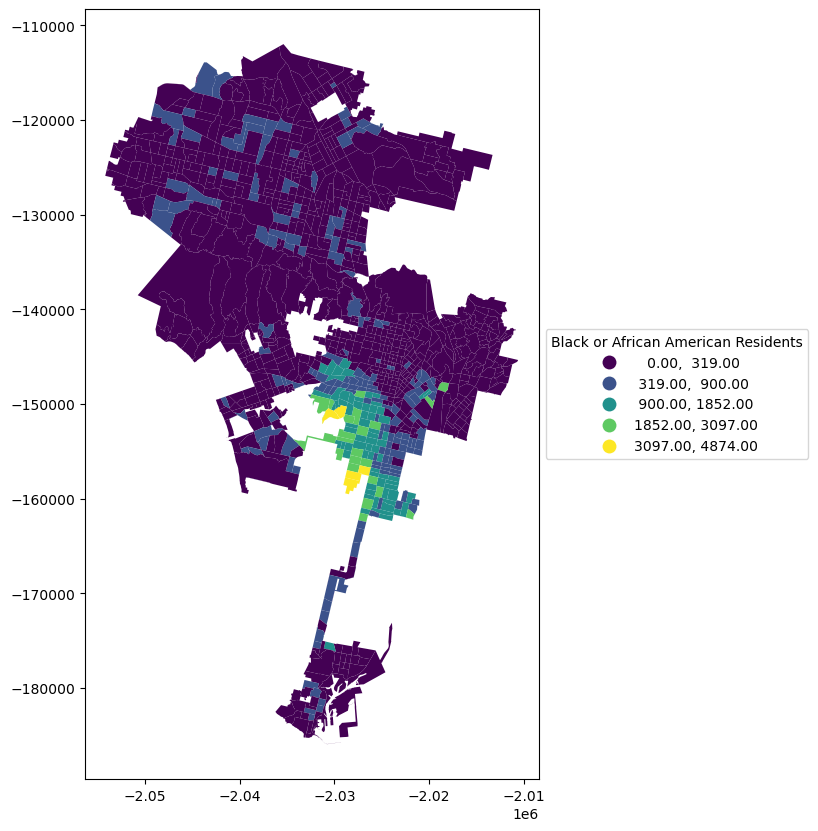

In [28]:
# Black or African American Population in the City of Los Angeles 
la_race.plot(figsize=(12,10),
            column='Black',
            legend=True,
            scheme='NaturalBreaks',
  legend_kwds={'loc': 'center left', 'title': 'Black or African American Residents', 'bbox_to_anchor': (1,0.50)})

plt.savefig('BlackA.png')

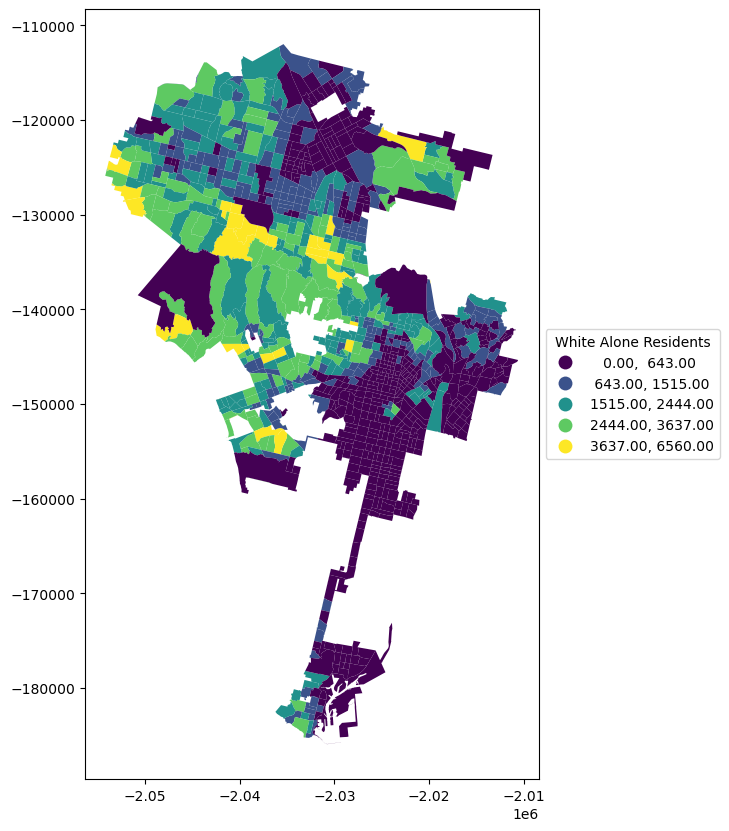

In [29]:
# White Alone in the City of Los Angeles 
la_race.plot(figsize=(12,10),
            column='White',
            legend=True,
            scheme='NaturalBreaks',
  legend_kwds={'loc': 'center left', 'title': 'White Alone Residents', 'bbox_to_anchor': (1,0.50)})
plt.savefig('WhiteA.png')

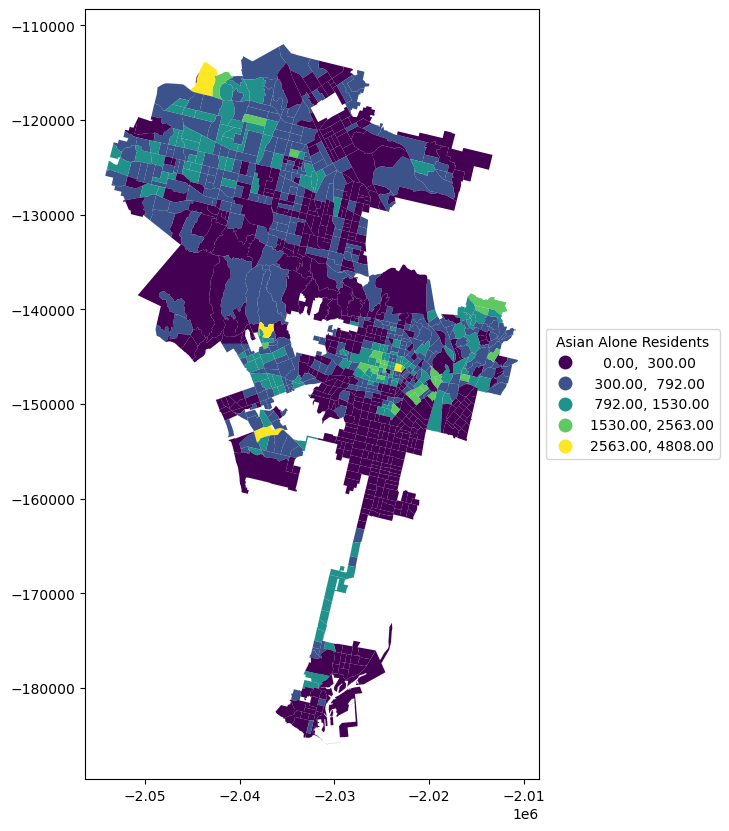

In [30]:
# Asian Alone in the City of Los Angeles 
la_race.plot(figsize=(12,10),
            column='Asian',
            legend=True,
            scheme='NaturalBreaks',
  legend_kwds={'loc': 'center left', 'title': 'Asian Alone Residents', 'bbox_to_anchor': (1,0.50)})

plt.savefig('AsianA.png')

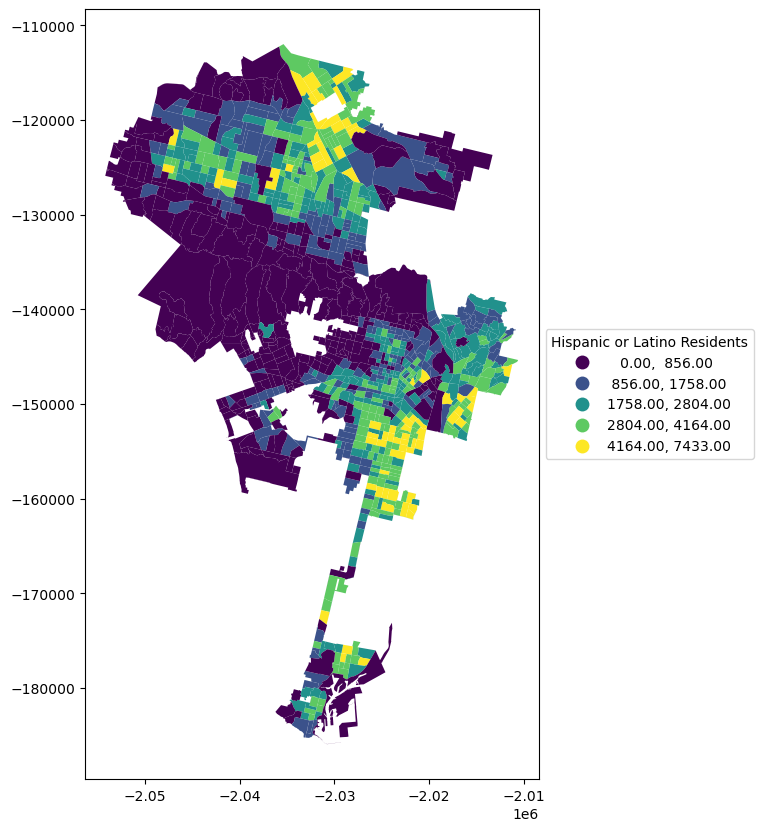

In [31]:
# Hispanic or Latino in the City of Los Angeles 
la_race.plot(figsize=(12,10),
            column='Hispanic or Latino',
            legend=True,
            scheme='NaturalBreaks',
  legend_kwds={'loc': 'center left', 'title': 'Hispanic or Latino Residents', 'bbox_to_anchor': (1,0.50)})

plt.savefig('LatinoA.png')

In [32]:
la_race.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 1168 entries, 0 to 1167
Data columns (total 40 columns):
 #   Column                                              Non-Null Count  Dtype   
---  ------                                              --------------  -----   
 0   GISJOIN                                             1168 non-null   object  
 1   STATEFP                                             1168 non-null   object  
 2   COUNTYFP                                            1168 non-null   object  
 3   TRACTCE                                             1168 non-null   object  
 4   GEOID                                               1168 non-null   object  
 5   NAME                                                1168 non-null   object  
 6   NAMELSAD                                            1168 non-null   object  
 7   MTFCC                                               1168 non-null   object  
 8   FUNCSTAT                                            1168 non

In [33]:
# find the sum for each race and ethncity 
print(la_race['White'].sum())
print(la_race['Black'].sum())
print(la_race['Asian'].sum())
print(la_race['Hispanic or Latino'].sum())

1378808
430875
543767
2220293


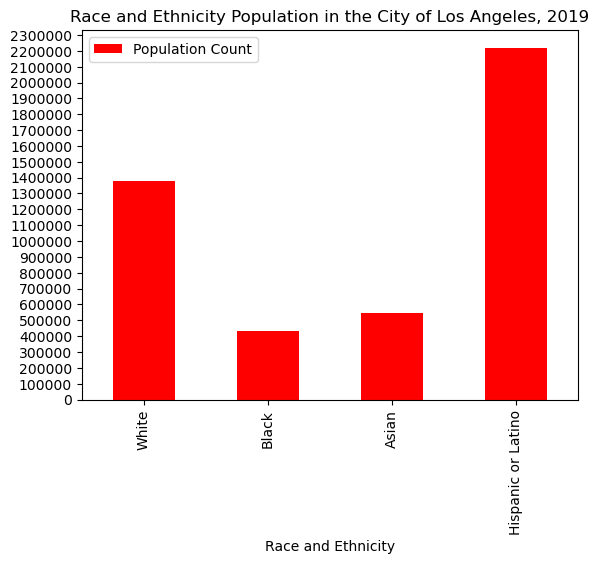

In [34]:
# attempt number 1 - creating a bar chart of race and ethnicty in LA County using pandas
# here i created a new variable 
#racebar1 only includes data for reach race and ethnicity in the City of LA  

racebar1 = racebar1=pd.DataFrame({'Race and Ethnicity':['White', 'Black', 'Asian', 'Hispanic or Latino'], 
                   'Population Count':[1378808, 430875, 543767, 2220293], 
                   'Color':['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728']}) 
                                  
ax=racebar1.plot.bar(x='Race and Ethnicity', 
               y='Population Count', 
               title='Race and Ethnicity Population in the City of Los Angeles, 2019',
               color='red')

yticks = range(0, max(racebar1['Population Count']) + 100000, 100000)
ax.set_yticks(yticks)
ax.set_yticklabels([f'{int(tick / 1)}' for tick in yticks])

plt.savefig('bar_chart1.png')

In [35]:
la_race.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 1168 entries, 0 to 1167
Data columns (total 40 columns):
 #   Column                                              Non-Null Count  Dtype   
---  ------                                              --------------  -----   
 0   GISJOIN                                             1168 non-null   object  
 1   STATEFP                                             1168 non-null   object  
 2   COUNTYFP                                            1168 non-null   object  
 3   TRACTCE                                             1168 non-null   object  
 4   GEOID                                               1168 non-null   object  
 5   NAME                                                1168 non-null   object  
 6   NAMELSAD                                            1168 non-null   object  
 7   MTFCC                                               1168 non-null   object  
 8   FUNCSTAT                                            1168 non

In [36]:
racebar1.head(5)

,Race and Ethnicity,Population Count,Color
0,White,1378808,#1f77b4
1,Black,430875,#ff7f0e
2,Asian,543767,#2ca02c
3,Hispanic or Latino,2220293,#d62728


In [37]:
# attempt number 2 - creating a bar chart of race and ethnicty in LA County using plotly 
# BAD CHART 
fig = px.bar(racebar1, 
       x='Population Count',
       title='Race and Ethnicity Population in City of Los Angeles 2019',)
    
      

# get rid of white lines inside the bars
fig.update_traces(marker_line_width=0)

# show the figure
fig.show()


In [38]:
# attempt number 2 - creating a bar chart of race and ethnicty in LA County using plotly 
# Good Chart  
fig = px.bar(racebar1, 
       x='Race and Ethnicity',
       y='Population Count',
       title='Race & Ethnicity in the City of Los Angeles, 2019',
       color='Race and Ethnicity', 
       color_discrete_sequence=racebar1['Color'])
    
# get rid of white lines inside the bars
fig.update_traces(marker_line_width=0)

fig.update_layout(xaxis_tickangle=0, 
                  plot_bgcolor='rgba(0,0,0,0)',
                  paper_bgcolor='rgba(0,0,0,0)'
                 )
 
# show the figure
fig.show()


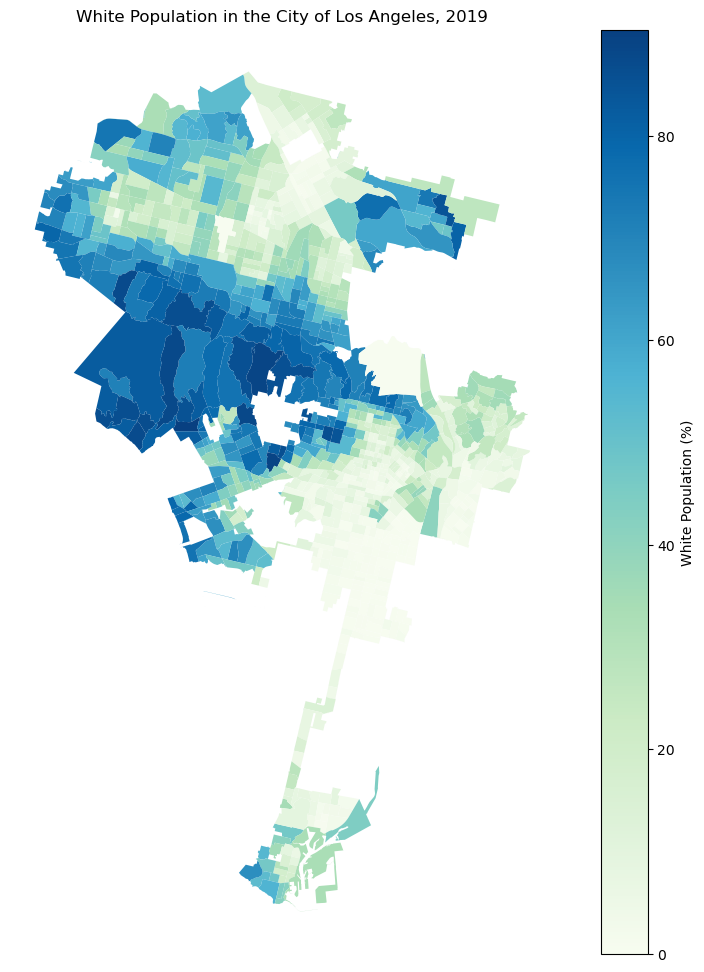

In [39]:
# making maps using matplotlib , #White Alone Residents in the City of LA 

fig,ax = plt.subplots(figsize=(12,12))

la_race.plot(ax=ax,column='% White Alone',legend=True,cmap='GnBu',
             legend_kwds={"label": "White Population (%)", "orientation": "vertical"})

ax.axis('off')
ax.set_title('White Population in the City of Los Angeles, 2019')

plt.savefig("M1white_population_los_angeles_2019.png")

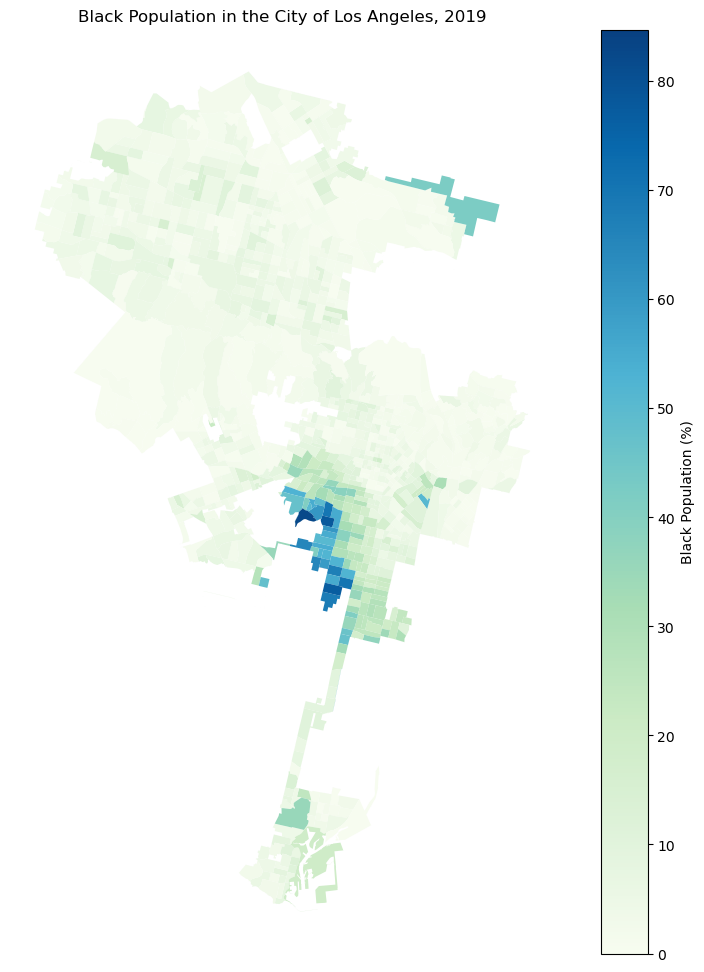

In [40]:
# making maps using matplotlib , #Black or African American Residents in the City of LA 

fig,ax = plt.subplots(figsize=(12,12))

la_race.plot(ax=ax,column='% Black or African American Alone',legend=True,cmap='GnBu',
             legend_kwds={"label": "Black Population (%)", "orientation": "vertical"})

ax.axis('off')
ax.set_title('Black Population in the City of Los Angeles, 2019')

plt.savefig("M1black_population_los_angeles_2019.png", transparent=True)

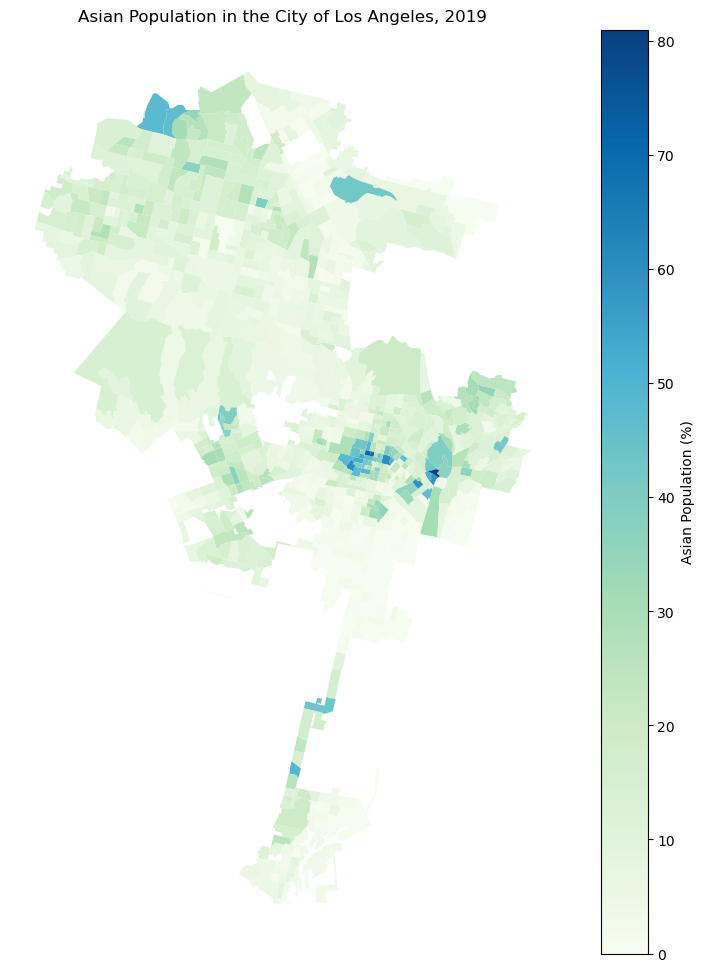

In [41]:
# making maps using matplotlib , #Asian Alone Residents in the City of LA 

fig,ax = plt.subplots(figsize=(12,12))

la_race.plot(ax=ax,column='% Asian Alone',legend=True,cmap='GnBu',
             legend_kwds={"label": "Asian Population (%)", "orientation": "vertical"})

ax.axis('off')
ax.set_title('Asian Population in the City of Los Angeles, 2019')

plt.savefig("M1asian_population_los_angeles_2019.png", transparent=True)

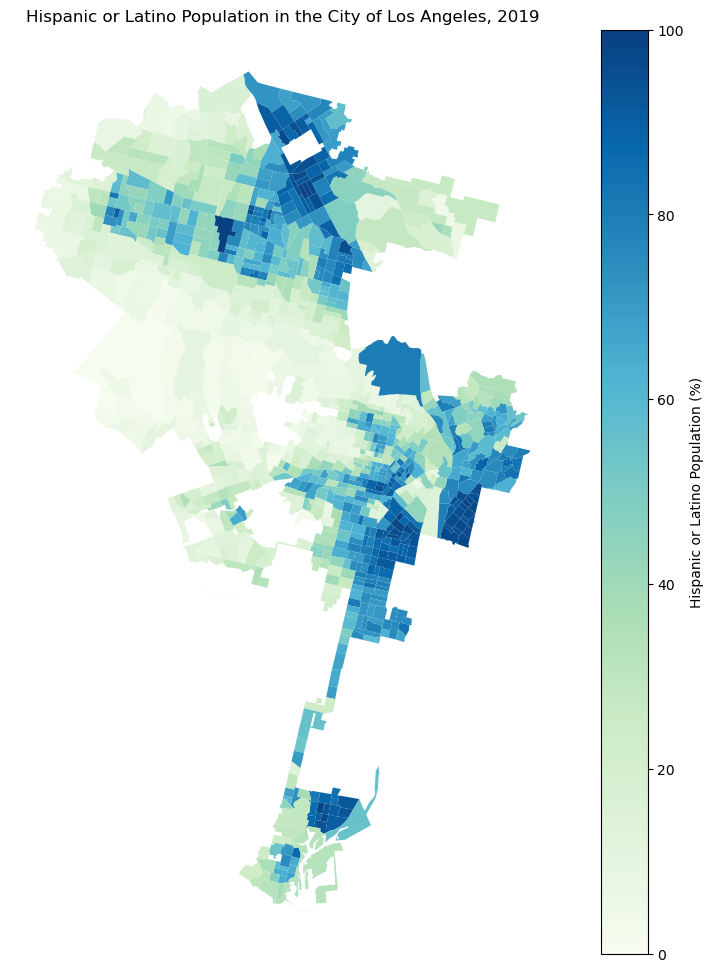

In [42]:
# making maps using matplotlib , #Hispanic or Latino Residents in the City of LA 

fig,ax = plt.subplots(figsize=(12,12))

la_race.plot(ax=ax,column='% Hispanic or Latino',legend=True,cmap='GnBu',
             legend_kwds={"label": "Hispanic or Latino Population (%)", "orientation": "vertical"})

ax.axis('off')
ax.set_title('Hispanic or Latino Population in the City of Los Angeles, 2019')

plt.savefig("M1hisp_population_los_angeles_2019.png")

In [43]:
la_race.head(2)

,GISJOIN,STATEFP,COUNTYFP,TRACTCE,GEOID,NAME,NAMELSAD,MTFCC,FUNCSTAT,ALAND,...,Hispanic or Latino,% Not Hispanic or Latino,% White Alone,% Black or African American Alone,% American Indian and Alaska Native Alone,% Asian Alone,% Native Hawaiian and Other Pacific Islander Alone,% Some Other Race Alone,% Two or More Races,% Hispanic or Latino
0,G0600370101110,06,037,101110,06037101110,1011.10,Census Tract 1011.10,G5020,S,1142401.0,...,1188,72.26,61.08,0.44,0.07,7.73,0.07,0.19,2.69,27.74
1,G0600370101122,06,037,101122,06037101122,1011.22,Census Tract 1011.22,G5020,S,2644045.0,...,147,95.68,84.64,2.17,0.44,6.46,0.00,0.00,1.97,4.32


# Examining SCAG High Injury Network

In [44]:
HIN =gpd.read_file('data4/High_Injury_Network_SCAG.geojson')

In [45]:
HIN.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 5964 entries, 0 to 5963
Data columns (total 17 columns):
 #   Column                Non-Null Count  Dtype   
---  ------                --------------  -----   
 0   OBJECTID              5964 non-null   int32   
 1   SEGMENT_ID            5964 non-null   object  
 2   SEGMENT_NAME          5964 non-null   object  
 3   CITY                  5964 non-null   object  
 4   COUNTY                5964 non-null   object  
 5   MILE                  5964 non-null   float64 
 6   FATALITY_VICTIM       5964 non-null   float64 
 7   SEVERE_INJURY_VICTIM  5964 non-null   float64 
 8   VICTIM_COUNT          5964 non-null   float64 
 9   HIN_AUTO              5964 non-null   object  
 10  HIN_PED               5964 non-null   object  
 11  HIN_BIKE              5964 non-null   object  
 12  HIN_ALL               5964 non-null   object  
 13  TRANSIT_AREA          5964 non-null   object  
 14  EQUITY_AREA           5964 non-null   object  
 

In [46]:
HIN.head(5)

,OBJECTID,SEGMENT_ID,SEGMENT_NAME,CITY,COUNTY,MILE,FATALITY_VICTIM,SEVERE_INJURY_VICTIM,VICTIM_COUNT,HIN_AUTO,HIN_PED,HIN_BIKE,HIN_ALL,TRANSIT_AREA,EQUITY_AREA,YEAR,geometry
0,1,10008,E Adams Ave,Orange,Orange,0.499465,0.0,0.5,0.5,No,Yes,No,Yes,No,Yes,2022,"MULTILINESTRING ((-117.83806 33.80665, -117.83..."
1,2,10140_0,E Balboa Blvd,Newport Beach,Orange,1.002174,0.0,2.5,2.5,No,Yes,No,Yes,No,No,2022,"MULTILINESTRING ((-117.89062 33.59901, -117.88..."
2,3,10140_1,E Balboa Blvd,Newport Beach,Orange,0.543847,0.0,1.0,1.0,Yes,No,No,Yes,No,No,2022,"MULTILINESTRING ((-117.90284 33.6031, -117.902..."
3,4,10145_1,E Ball Rd,Anaheim,Orange,1.098312,0.0,3.0,3.0,Yes,No,No,Yes,Yes,Yes,2022,"MULTILINESTRING ((-117.88851 33.8181, -117.888..."
4,5,10145_2,E Ball Rd,Anaheim,Orange,0.755181,0.0,1.0,1.0,Yes,No,No,Yes,Yes,Yes,2022,"MULTILINESTRING ((-117.89739 33.81809, -117.89..."


In [47]:
HINla = HIN[HIN.CITY == 'Los Angeles']

In [48]:
HINla.head(2)

,OBJECTID,SEGMENT_ID,SEGMENT_NAME,CITY,COUNTY,MILE,FATALITY_VICTIM,SEVERE_INJURY_VICTIM,VICTIM_COUNT,HIN_AUTO,HIN_PED,HIN_BIKE,HIN_ALL,TRANSIT_AREA,EQUITY_AREA,YEAR,geometry
1901,1902,10000_2,Branford St,Los Angeles,Los_Angeles,1.001868,1.0,3.0,4.0,Yes,No,No,Yes,Yes,Yes,2022,"MULTILINESTRING ((-118.42306 34.23372, -118.42..."
1906,1907,10178,Bridge St,Los Angeles,Los_Angeles,0.440117,0.0,1.0,1.0,Yes,No,No,Yes,Yes,Yes,2022,"MULTILINESTRING ((-118.21558 34.05145, -118.21..."


<Axes: >

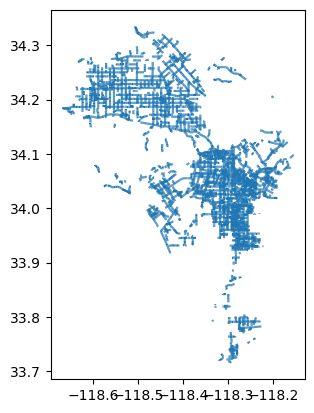

In [49]:
HINla.plot()

In [50]:
# general notes 
#either conduct spatial join or try a different line of code 
# dont think that i need to convert to geodataframe because we are not using points 

In [51]:
# conduct a spatial join 
# error message because there is a mismatch between the projection 

# la_race = ESRI:102003 and HINla = EPSG = 4326

# Next Step is too create a new variable/copy to make sure I create one with the correct projection 

#hmmm i don't think I made a copy 

# first line of code is converting 

la_race = la_race.to_crs('EPSG:4326')
print("Original CRS:" , la_race.crs)

Original CRS: EPSG:4326


# Spatial Joins 

In [52]:
# conduct a spatial join 
# error message because there is a mismatch between the projection 

# la_race = ESRI:102003 and HINla = EPSG = 4326

# Here I converted the dataframe. I don't think I made a copy though 

la_race = la_race.to_crs('EPSG:4326')
la_race.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [53]:
#conducting a spatial join, however, it is not necessary for overlaying the map 
# helpful for conducitng another layer of analysis 
la_race_HIN =gpd.sjoin(la_race,HINla)
la_race_HIN

,GISJOIN,STATEFP,COUNTYFP,TRACTCE,GEOID,NAME,NAMELSAD,MTFCC,FUNCSTAT,ALAND,...,FATALITY_VICTIM,SEVERE_INJURY_VICTIM,VICTIM_COUNT,HIN_AUTO,HIN_PED,HIN_BIKE,HIN_ALL,TRANSIT_AREA,EQUITY_AREA,YEAR
0,G0600370101110,06,037,101110,06037101110,1011.10,Census Tract 1011.10,G5020,S,1142401.0,...,3.0,6.0,9.0,Yes,Yes,Yes,Yes,No,Yes,2022
0,G0600370101110,06,037,101110,06037101110,1011.10,Census Tract 1011.10,G5020,S,1142401.0,...,1.0,0.0,1.0,Yes,No,No,Yes,No,Yes,2022
1,G0600370101122,06,037,101122,06037101122,1011.22,Census Tract 1011.22,G5020,S,2644045.0,...,0.0,0.5,0.5,Yes,No,No,Yes,No,Yes,2022
2,G0600370101210,06,037,101210,06037101210,1012.10,Census Tract 1012.10,G5020,S,650690.0,...,0.0,4.5,4.5,Yes,Yes,No,Yes,No,Yes,2022
2,G0600370101210,06,037,101210,06037101210,1012.10,Census Tract 1012.10,G5020,S,650690.0,...,3.0,6.0,9.0,Yes,Yes,Yes,Yes,No,Yes,2022
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1166,G0600370980031,06,037,980031,06037980031,9800.31,Census Tract 9800.31,G5020,S,12641938.0,...,0.5,0.5,1.0,Yes,No,No,Yes,No,Yes,2022
1166,G0600370980031,06,037,980031,06037980031,9800.31,Census Tract 9800.31,G5020,S,12641938.0,...,0.0,1.0,1.0,Yes,No,No,Yes,No,Yes,2022
1166,G0600370980031,06,037,980031,06037980031,9800.31,Census Tract 9800.31,G5020,S,12641938.0,...,0.0,2.0,2.0,No,Yes,Yes,Yes,No,Yes,2022
1166,G0600370980031,06,037,980031,06037980031,9800.31,Census Tract 9800.31,G5020,S,12641938.0,...,0.0,4.0,4.0,No,Yes,Yes,Yes,No,Yes,2022


In [54]:
la_race_HIN.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Index: 4436 entries, 0 to 1167
Data columns (total 57 columns):
 #   Column                                              Non-Null Count  Dtype   
---  ------                                              --------------  -----   
 0   GISJOIN                                             4436 non-null   object  
 1   STATEFP                                             4436 non-null   object  
 2   COUNTYFP                                            4436 non-null   object  
 3   TRACTCE                                             4436 non-null   object  
 4   GEOID                                               4436 non-null   object  
 5   NAME                                                4436 non-null   object  
 6   NAMELSAD                                            4436 non-null   object  
 7   MTFCC                                               4436 non-null   object  
 8   FUNCSTAT                                            4436 non-null

<Axes: xlabel='% Hispanic or Latino', ylabel='MILE'>

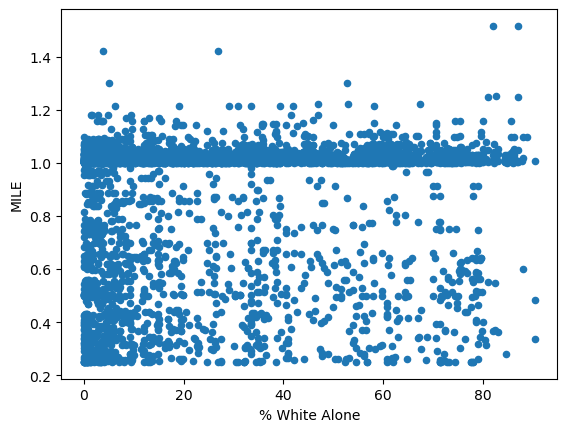

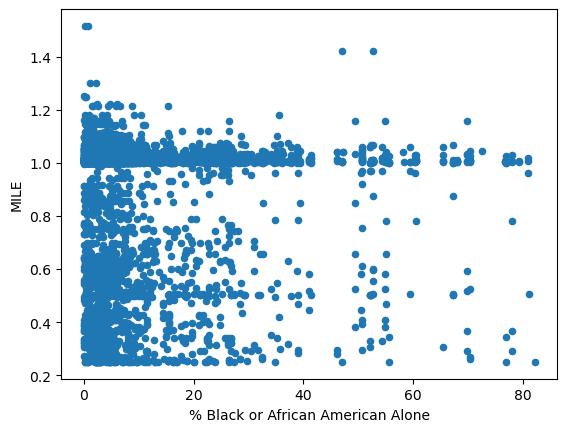

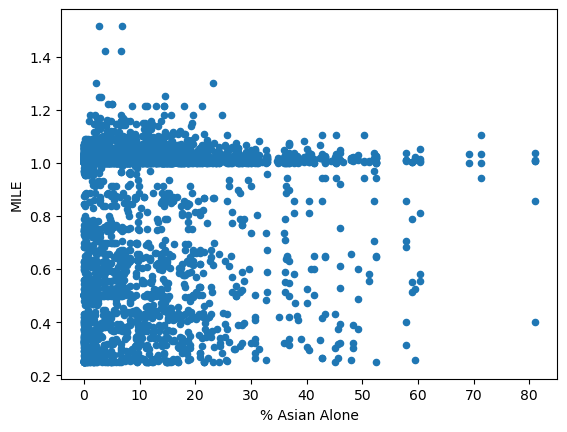

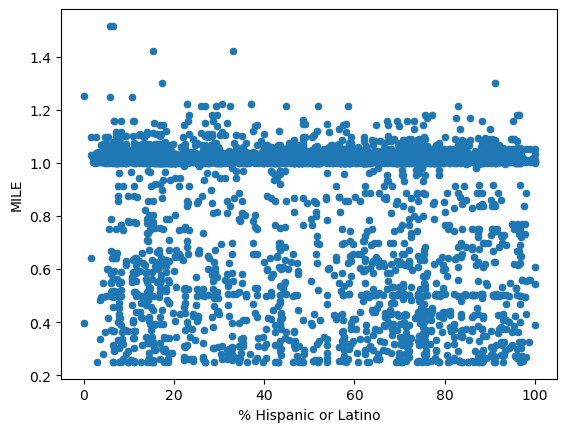

In [55]:
# Visualizing the data 
# scatter plots 
la_race_HIN.plot.scatter(x='% White Alone', y='MILE')
la_race_HIN.plot.scatter(x='% Black or African American Alone', y='MILE')
la_race_HIN.plot.scatter(x='% Asian Alone', y='MILE')
la_race_HIN.plot.scatter(x='% Hispanic or Latino', y='MILE')

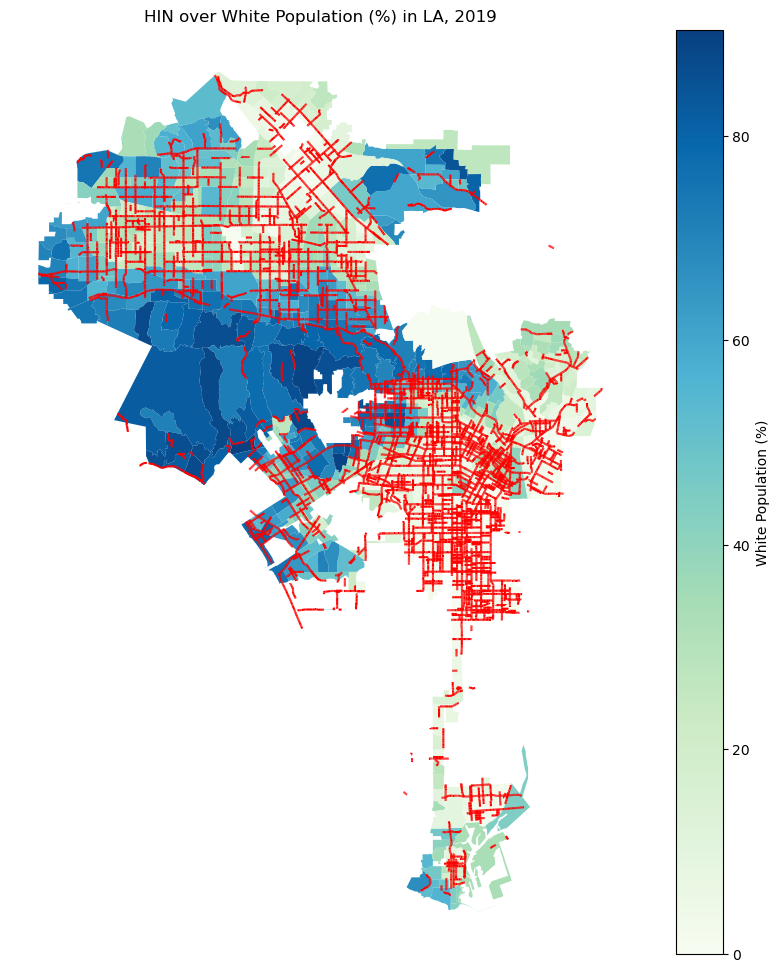

In [56]:
#trying to overlap a map - White Alone 
fig,ax = plt.subplots(figsize=(12,12))

la_race.plot(ax=ax,column='% White Alone',legend=True,cmap='GnBu',
             legend_kwds={"label": "White Population (%)", "orientation": "vertical"})

#Overlay HIN on the City of LA 
HINla.plot(ax=ax, color='red', markersize=.5)

ax.axis('off')
ax.set_title('HIN over White Population (%) in LA, 2019')

plt.savefig('Images/HIN_White2.jpg')

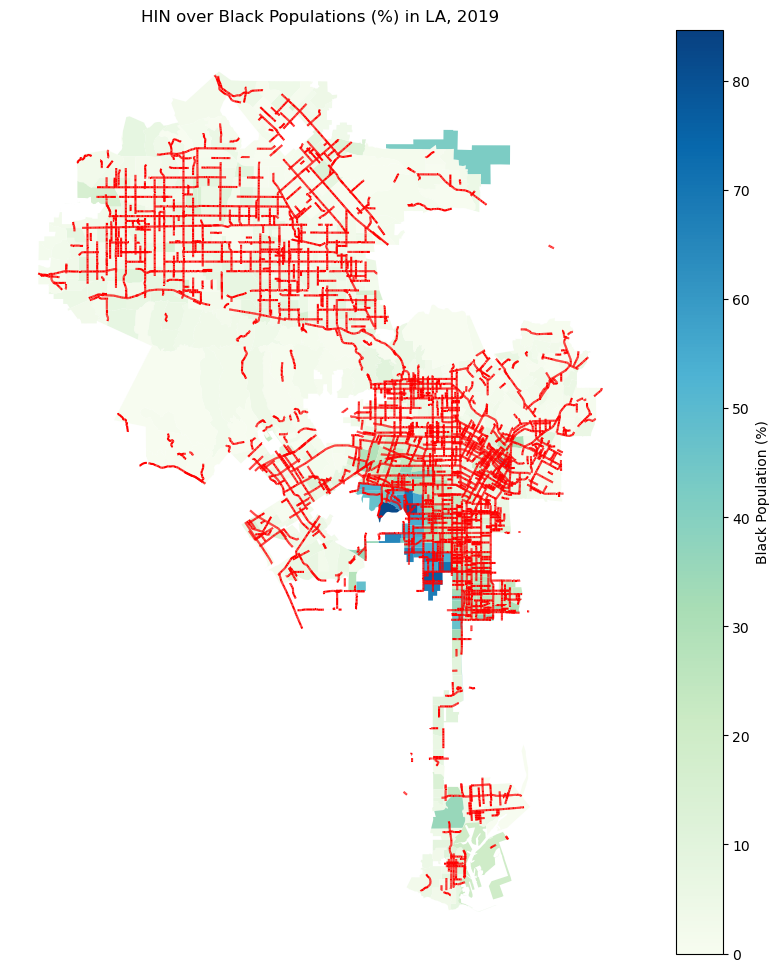

In [57]:
#trying to overlap a map - Black or African American Alone 
fig,ax = plt.subplots(figsize=(12,12))

la_race.plot(ax=ax,column='% Black or African American Alone',legend=True,cmap='GnBu',
             legend_kwds={"label": "Black Population (%)", "orientation": "vertical"})

#Overlay HIN on the City of LA 
HINla.plot(ax=ax, color='red', markersize=.5)

ax.axis('off')
ax.set_title('HIN over Black Populations (%) in LA, 2019')

plt.savefig('Images/HIN_Black2.jpg')

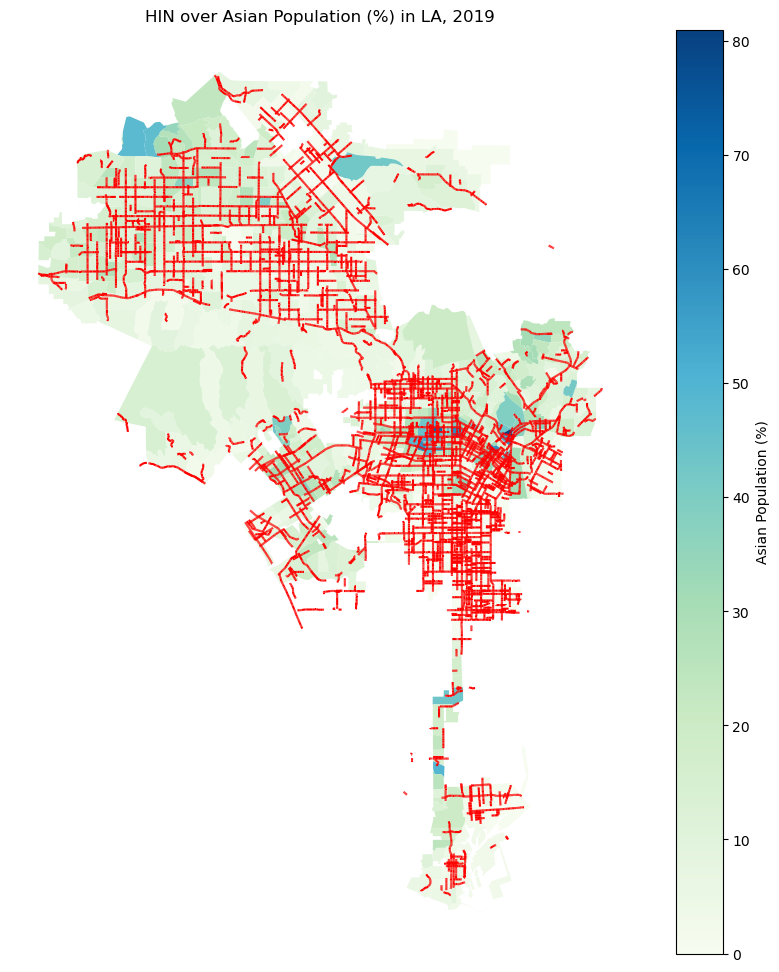

In [58]:
#trying to overlap a map - Asian Alone 
fig,ax = plt.subplots(figsize=(12,12))

la_race.plot(ax=ax,column='% Asian Alone',legend=True,cmap='GnBu',
             legend_kwds={"label": "Asian Population (%)", "orientation": "vertical"})

#Overlay HIN on the City of LA 
HINla.plot(ax=ax, color='red', markersize=.5)

ax.axis('off')
ax.set_title('HIN over Asian Population (%) in LA, 2019')

plt.savefig('Images/HIN_Asian2.jpg')

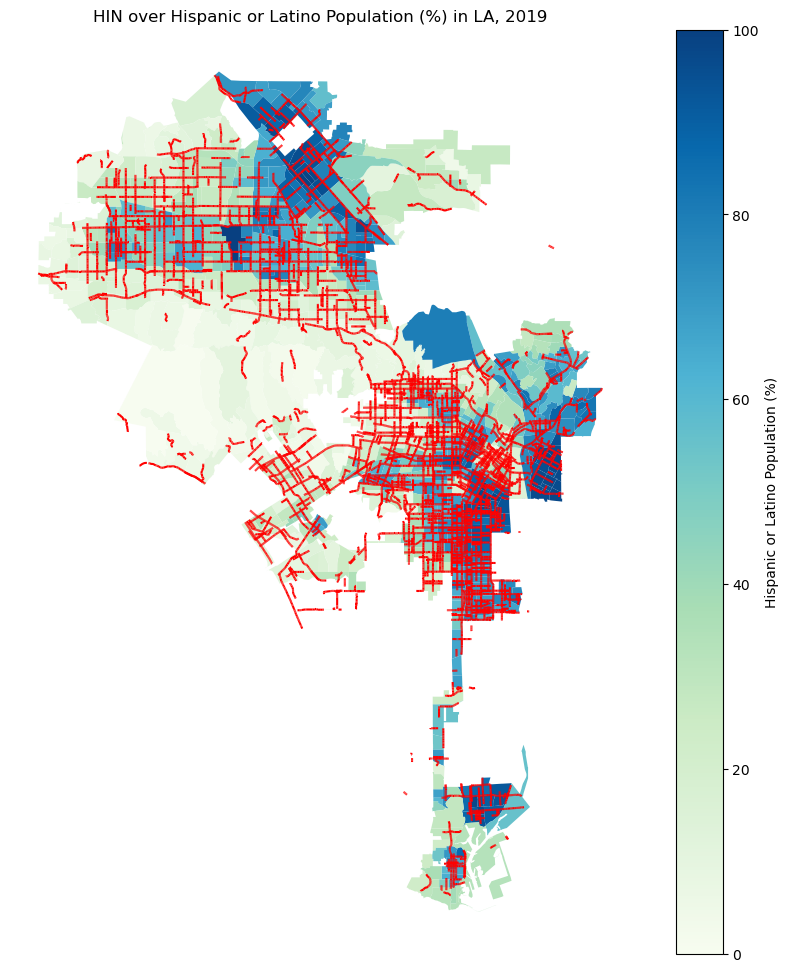

In [59]:
#trying to overlap a map - Hispanic or Latino 
fig,ax = plt.subplots(figsize=(12,12))

la_race.plot(ax=ax,column='% Hispanic or Latino',legend=True,cmap='GnBu',
             legend_kwds={"label": "Hispanic or Latino Population (%)", "orientation": "vertical"})

#Overlay HIN on the City of LA 
HINla.plot(ax=ax, color='red', markersize=.001)

ax.axis('off')
ax.set_title('HIN over Hispanic or Latino Population (%) in LA, 2019')

plt.savefig('Images/HIN_Hispanic2.jpg')

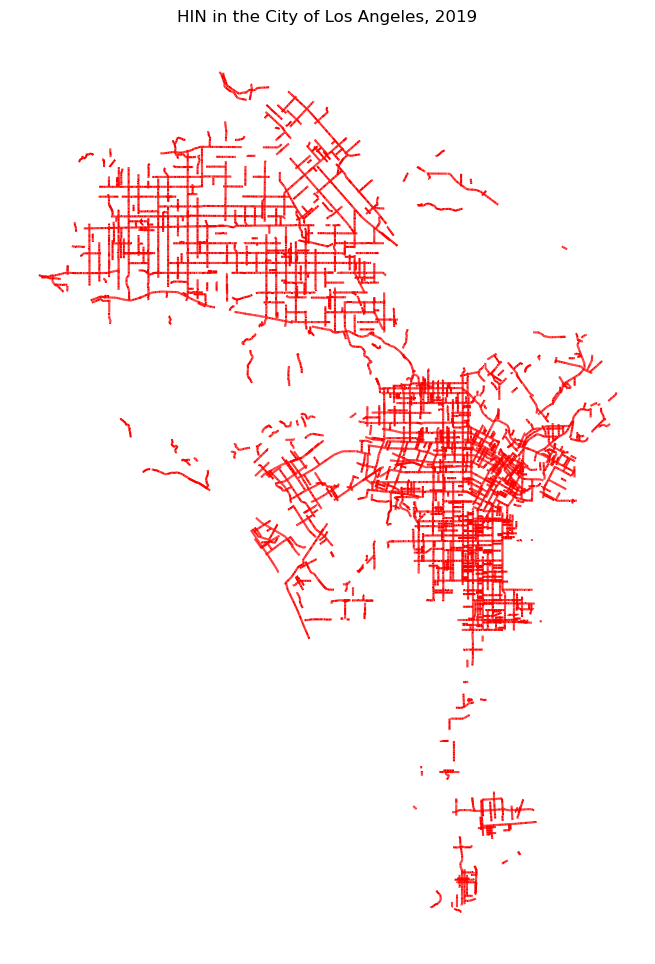

In [60]:
#mapping only HIN in City of LA 
fig,ax = plt.subplots(figsize=(12,12))

HINla.plot(ax=ax, color='red', markersize=.001)

ax.axis('off')
ax.set_title('HIN in the City of Los Angeles, 2019')

plt.savefig('data4/HIN2.jpg')

In [61]:
# save file - plt.savefig('data4/name.jpg')

# Creating Interactive Maps

In [62]:
import folium 
from folium.features import GeoJsonTooltip

In [63]:
la_neighborhood =gpd.read_file('data4/LA_Times_Neighborhood_Boundaries.geojson')

In [64]:
la_neighborhood.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 114 entries, 0 to 113
Data columns (total 3 columns):
 #   Column    Non-Null Count  Dtype   
---  ------    --------------  -----   
 0   OBJECTID  114 non-null    int32   
 1   name      114 non-null    object  
 2   geometry  114 non-null    geometry
dtypes: geometry(1), int32(1), object(1)
memory usage: 2.4+ KB


In [65]:
HINla.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Index: 1490 entries, 1901 to 5056
Data columns (total 17 columns):
 #   Column                Non-Null Count  Dtype   
---  ------                --------------  -----   
 0   OBJECTID              1490 non-null   int32   
 1   SEGMENT_ID            1490 non-null   object  
 2   SEGMENT_NAME          1490 non-null   object  
 3   CITY                  1490 non-null   object  
 4   COUNTY                1490 non-null   object  
 5   MILE                  1490 non-null   float64 
 6   FATALITY_VICTIM       1490 non-null   float64 
 7   SEVERE_INJURY_VICTIM  1490 non-null   float64 
 8   VICTIM_COUNT          1490 non-null   float64 
 9   HIN_AUTO              1490 non-null   object  
 10  HIN_PED               1490 non-null   object  
 11  HIN_BIKE              1490 non-null   object  
 12  HIN_ALL               1490 non-null   object  
 13  TRANSIT_AREA          1490 non-null   object  
 14  EQUITY_AREA           1490 non-null   object  
 15

In [66]:
HINla.head(2)

,OBJECTID,SEGMENT_ID,SEGMENT_NAME,CITY,COUNTY,MILE,FATALITY_VICTIM,SEVERE_INJURY_VICTIM,VICTIM_COUNT,HIN_AUTO,HIN_PED,HIN_BIKE,HIN_ALL,TRANSIT_AREA,EQUITY_AREA,YEAR,geometry
1901,1902,10000_2,Branford St,Los Angeles,Los_Angeles,1.001868,1.0,3.0,4.0,Yes,No,No,Yes,Yes,Yes,2022,"MULTILINESTRING ((-118.42306 34.23372, -118.42..."
1906,1907,10178,Bridge St,Los Angeles,Los_Angeles,0.440117,0.0,1.0,1.0,Yes,No,No,Yes,Yes,Yes,2022,"MULTILINESTRING ((-118.21558 34.05145, -118.21..."


<Axes: >

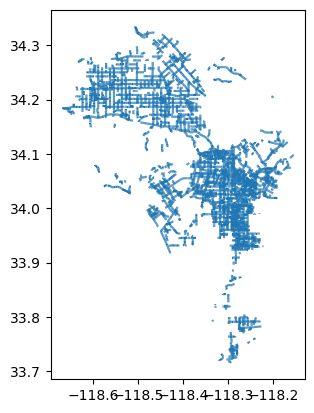

In [67]:
HINla.plot()

In [68]:
m = folium.Map([34.0549, -118.2426], tiles="CartoDB positron")
m

In [69]:
# changing colors 
def style_function(feature):
    return {
        'color': 'red',  
        'weight': 3,  
        'opacity': 1.0,
    }



In [70]:
folium.GeoJson(
    HINla,
    name='HIN Network, 2019',
    style_function=style_function,
    tooltip=GeoJsonTooltip(
        fields=['SEGMENT_NAME', 'FATALITY_VICTIM', 'VICTIM_COUNT'], 
        aliases=['Street Name:', 'Fatality:', 'Victim Count:']
    )
).add_to(m)

folium.LayerControl(collapsed=False).add_to(m)

m.save('map1.html')

m